### Final annotation of Epithelial cells from large intestine (adult/paediatric)


Preprocessing:
- epithelial cells from main object subsetted, then subsetted cells from large intesine, and further subsetted only cells from adult and paediatric patients
- performed scvi batch correction to prepare objects

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sc.logging.print_header()

scanpy==1.8.0 anndata==0.8.0 umap==0.4.6 numpy==1.20.1 scipy==1.6.1 pandas==1.3.5 scikit-learn==0.24.1 statsmodels==0.13.5 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3 pynndescent==0.5.2


In [4]:
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/post_scvi20221124/LI_AP_epi.hvg5000_noRPL.scvi_output.with_annotv2.22021124.h5ad')

In [6]:
annot_v2 = pd.read_csv('/nfs/team205/ao15/Megagut/Annotations_v2/Compartments/Epithelial_separation/Large_intestine_adult/Large_intestine_adult_rename.withdoublets.21112022.csv',index_col=0)

In [7]:
annot_v2

,annot_v3
index,
AAACGGGAGGCCATAG-Pan_T7917821,LI_AP_stem/TA
AAACGGGCAAGTAATG-Pan_T7917821,LI_AP_CT_colonocyte
AAAGATGAGGAGTAGA-Pan_T7917821,LI_AP_CT_colonocyte
AAAGATGTCAATCTCT-Pan_T7917821,LI_AP_CT_colonocyte
AAAGATGTCTCTGCTG-Pan_T7917821,LI_AP_stem/TA
...,...
TGAAAGAGTGCCTGTG-GSM5525958,Doublets
TGCGGGTAGCCAGTAG-GSM5525958,Doublets
TGGCGCACAGATAATG-GSM5525958,LI_AP_stem/TA


In [8]:
adata.obs['annot_v2'] = annot_v2

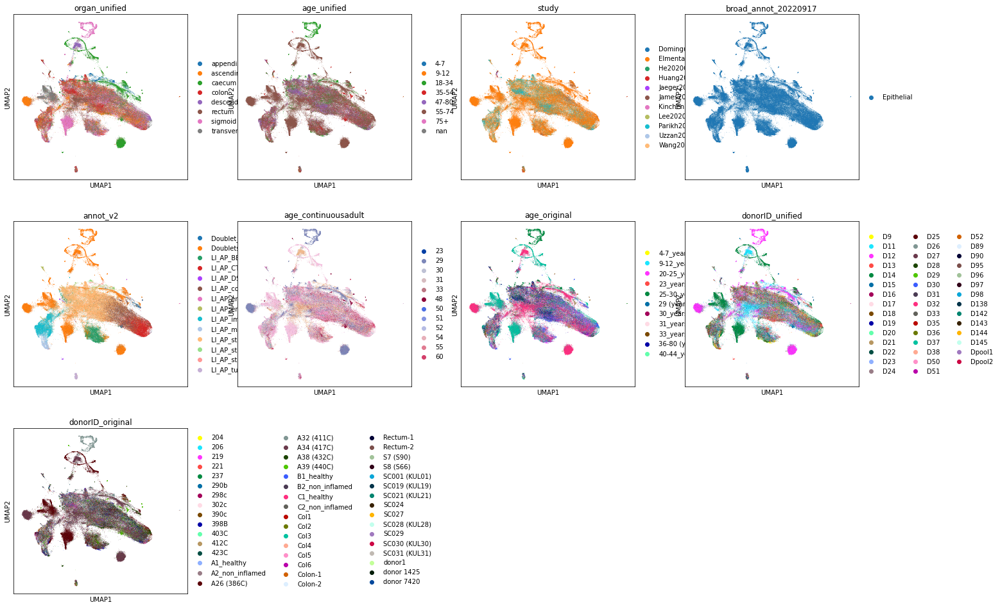

In [24]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(adata, color=['organ_unified', 'age_unified','study','broad_annot_20220917','annot_v2','age_continuousadult','age_original','donorID_unified','donorID_original'],cmap='OrRd')

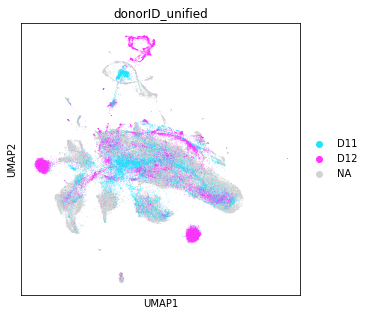

In [32]:
sc.pl.umap(adata,color='donorID_unified',groups=['D12','D11'])

In [10]:
adata.write_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/post_scvi20221124/LI_AP_epi.hvg5000_noRPL.scvi_output.with_annotv2.22021124.h5ad')

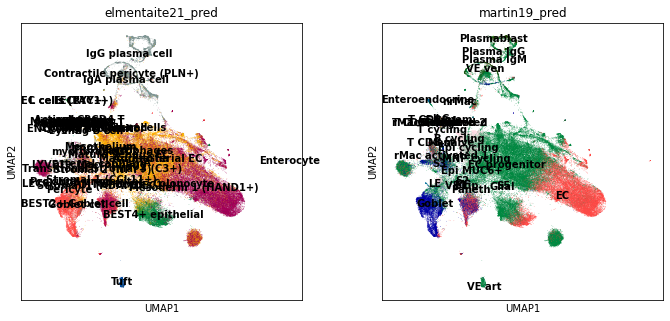

In [11]:
sc.pl.umap(adata, color=['elmentaite21_pred','martin19_pred'],legend_loc='on data')

In [12]:
adata.X.max()

18875.0

In [166]:
#save raw counts in layers
adata.layers['counts'] = adata.X
#normalise and transform
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

In [167]:
adata.X.max()

8.88183

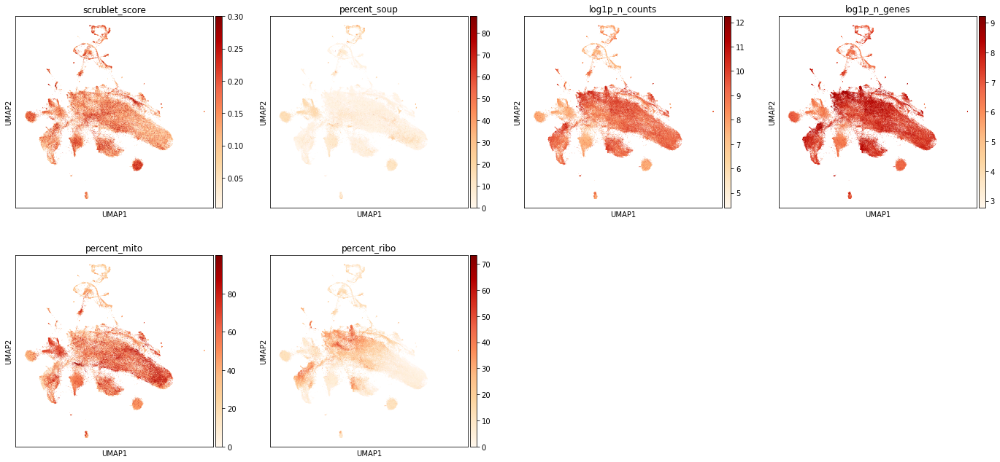

In [15]:
#plot some basic QC
sc.pl.umap(adata, color = ['scrublet_score','percent_soup','log1p_n_counts','log1p_n_genes','percent_mito','percent_ribo'],cmap='OrRd')

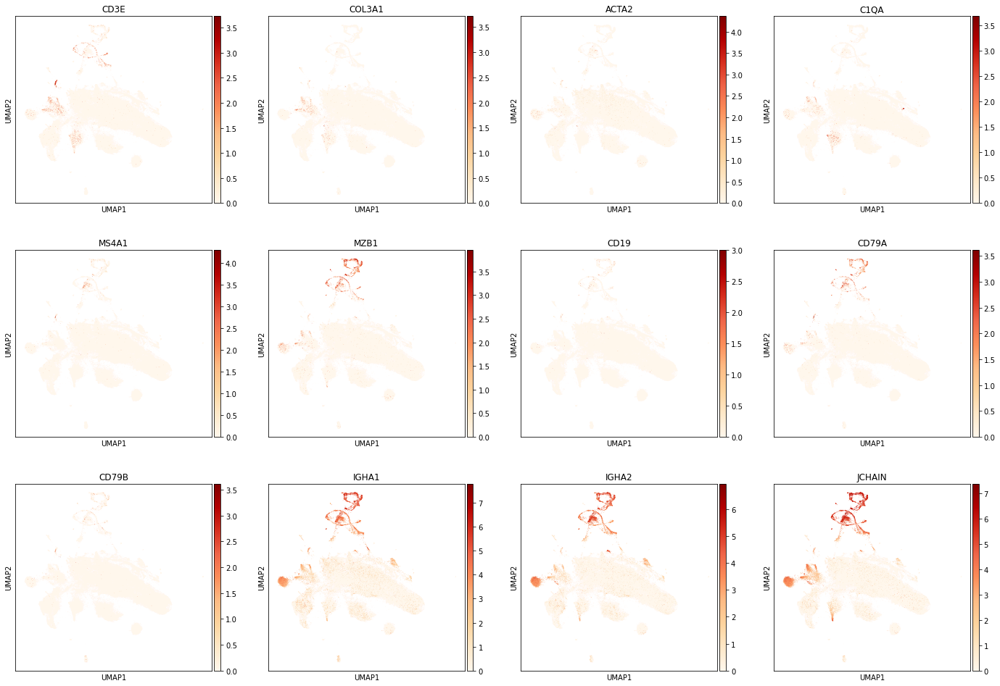

In [31]:
#plot doublet genes
sc.pl.umap(adata, color = ['CD3E','COL3A1','ACTA2','C1QA','MS4A1','MZB1','CD19','CD79A','CD79B','IGHA1','IGHA2','JCHAIN'],cmap='OrRd')

In [17]:
#score cell cycle genes
cell_cycle_genes = ['MCM5',
'PCNA',
 'TYMS',
 'FEN1',
 'MCM2',
 'MCM4',
 'RRM1',
 'UNG',
 'GINS2',
 'MCM6',
 'CDCA7',
 'DTL',
 'PRIM1',
 'UHRF1',
 'MLF1IP',
 'HELLS',
 'RFC2',
 'RPA2',
 'NASP',
 'RAD51AP1',
 'GMNN',
 'WDR76',
 'SLBP',
 'CCNE2',
 'UBR7',
 'POLD3',
 'MSH2',
 'ATAD2',
 'RAD51',
 'RRM2',
 'CDC45',
 'CDC6',
 'EXO1',
 'TIPIN',
 'DSCC1',
 'BLM',
 'CASP8AP2',
 'USP1',
 'CLSPN',
 'POLA1',
 'CHAF1B',
 'BRIP1',
 'E2F8',
 'HMGB2',
 'CDK1',
 'NUSAP1',
 'UBE2C',
 'BIRC5',
 'TPX2',
 'TOP2A',
 'NDC80',
 'CKS2',
 'NUF2',
 'CKS1B',
 'MKI67',
 'TMPO',
 'CENPF',
 'TACC3',
 'FAM64A',
 'SMC4',
 'CCNB2',
 'CKAP2L',
 'CKAP2',
 'AURKB',
 'BUB1',
 'KIF11',
 'ANP32E',
 'TUBB4B',
 'GTSE1',
 'KIF20B',
 'HJURP',
 'CDCA3',
 'HN1',
 'CDC20',
 'TTK',
 'CDC25C',
 'KIF2C',
 'RANGAP1',
 'NCAPD2',
 'DLGAP5',
 'CDCA2',
 'CDCA8',
 'ECT2',
 'KIF23',
 'HMMR',
 'AURKA',
 'PSRC1',
 'ANLN',
 'LBR',
 'CKAP5',
 'CENPE',
 'CTCF',
 'NEK2',
 'G2E3',
 'GAS2L3',
 'CBX5',
 'CENPA']

In [18]:
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)
adata = adata[adata.obs.G2M_score.sort_values(ascending=True).index].copy()

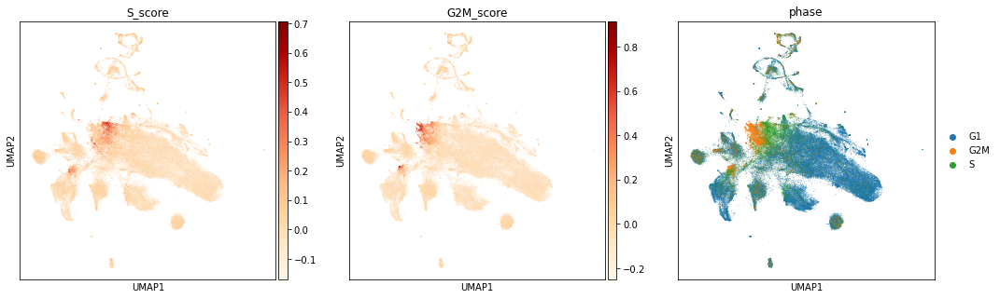

In [19]:
sc.pl.umap(adata,color=['S_score', 'G2M_score', 'phase'],cmap='OrRd')

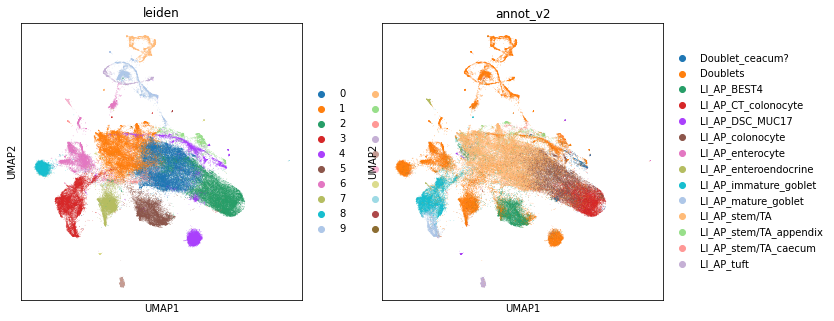

In [20]:
sc.tl.leiden(adata, resolution = 0.5, neighbors_key="neighbors_scvi")
sc.pl.umap(adata,color=['leiden','annot_v2'])

In [22]:
import sys
sys.path.append("/home/jovyan/ao15/Megagut/")
from re5_combine import *

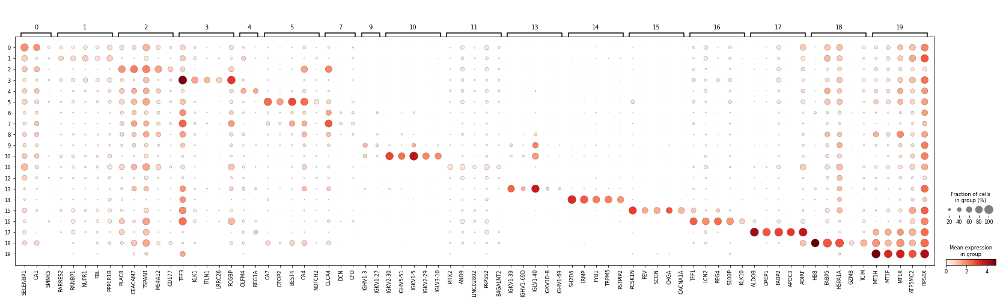

In [23]:
adata.raw = adata.copy()
mkst = calc_marker_stats(adata, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(adata, groupby='leiden', mks=mks)

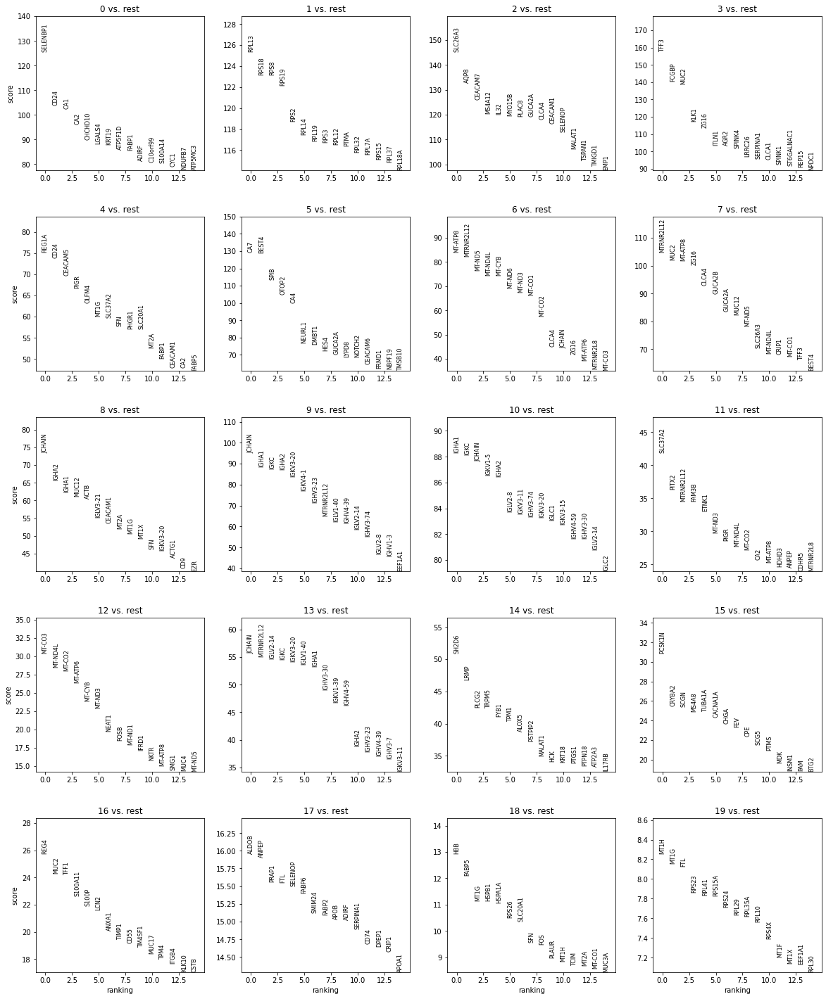

In [25]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=15, sharey=False)

In [26]:
pd.set_option('display.max_columns', 100)
pd.crosstab(adata.obs.annot_v2,adata.obs.leiden)

leiden,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
annot_v2,,,,,,,,,,,,,,,,,,,,
Doublet_ceacum?,8,56,104,2,811,1,1,0,0,0,0,57,0,1,0,0,1,0,0,0
Doublets,1198,1440,905,273,6228,1656,6717,6183,3962,3749,2740,955,166,1288,12,8,14,1,65,1
LI_AP_BEST4,373,650,76,95,56,6644,84,80,13,0,0,14,38,0,0,0,0,0,0,0
LI_AP_CT_colonocyte,174,2,8960,10,142,3,18,47,32,11,0,35,13,0,0,1,3,0,0,0
LI_AP_DSC_MUC17,0,20,1,7,1,0,2,0,0,0,0,0,0,0,0,0,288,0,0,0
LI_AP_colonocyte,6007,131,6674,17,611,11,108,148,39,21,2,65,8,0,0,0,0,0,0,0
LI_AP_enterocyte,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,86,0,0
LI_AP_enteroendocrine,1,14,5,23,0,0,3,9,0,0,1,1,4,0,1,416,1,0,0,5
LI_AP_immature_goblet,105,397,17,8282,18,6,139,16,21,3,2,9,28,7,0,1,8,0,0,0


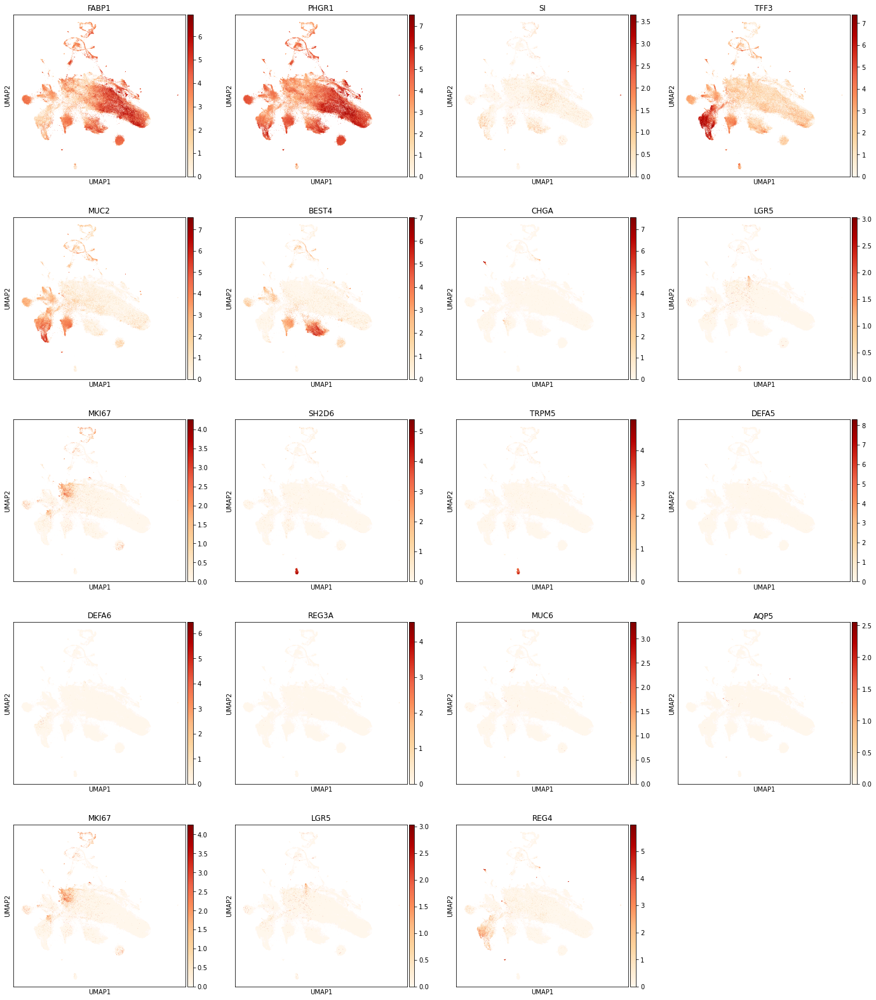

In [33]:
sc.pl.umap(adata,color=['FABP1','PHGR1','SI','TFF3','MUC2','BEST4','CHGA','LGR5','MKI67','SH2D6','TRPM5','DEFA5','DEFA6','REG3A','MUC6','AQP5','MKI67','LGR5','REG4'],cmap='OrRd')

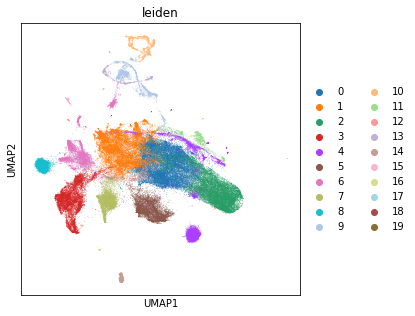

In [28]:
sc.pl.umap(adata,color='leiden')

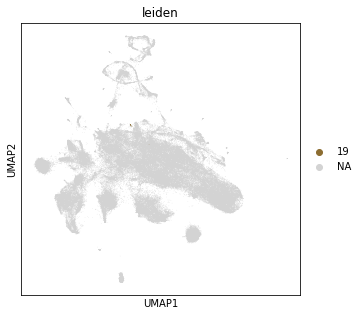

In [38]:
sc.pl.umap(adata,color='leiden',groups='19')

In [39]:
new_cluster_names = [
    'LI_AP_colonocyte','LI_AP_stem/TA', #0,1
    'LI_AP_late_colonocyte','LI_AP_goblet', #2,3
    'LI_AP_D12','LI_AP_BEST4', #4,5
    'Doublets','Doublets', #6,7 
   'LI_AP_D12','Doublets', #8,9
    'Doublets','LI_AP_donorspecific?',#10,11
    'LI_AP_stem/TA','Doublets',#12,13
     'LI_AP_tuft','LI_AP_enteroendocrine',#14,15
     'LI_AP_DSC_MUC17','LI_AP_enterocyte',#16,17
     'Doublets','LI_AP_stem/TA',#18,19

]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

adata.obs['annot_v3'] = [conv[x] for x in adata.obs['leiden']]

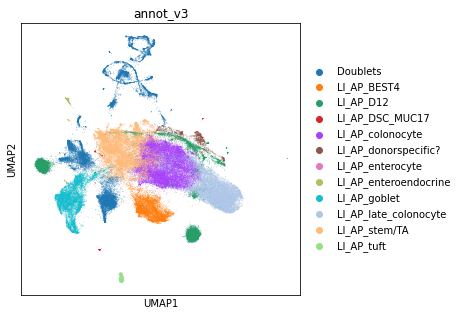

In [40]:
sc.pl.umap(adata,color='annot_v3')

In [43]:
col = adata[adata.obs.annot_v3.isin(['LI_AP_colonocyte','LI_AP_late_colonocyte'])].copy()

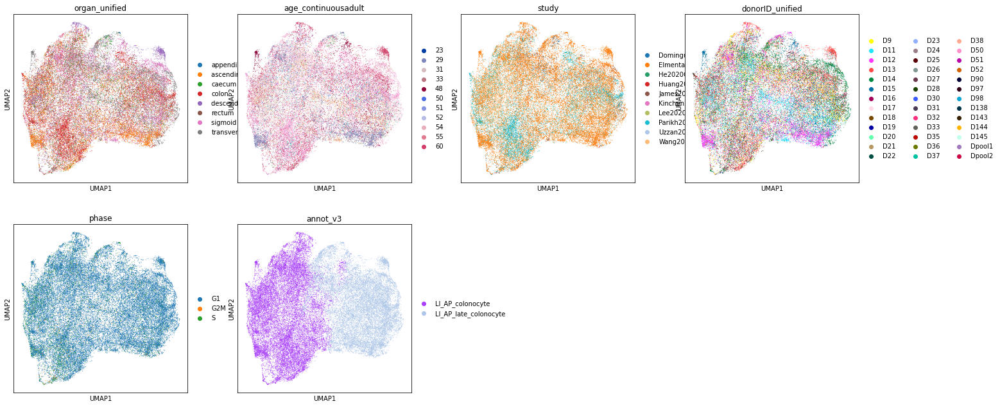

In [46]:
sc.pp.neighbors(
        col,
            use_rep="X_scvi",
            n_pcs=col.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(col, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(col, color=['organ_unified', 'age_continuousadult','study','donorID_unified','phase','annot_v3'])

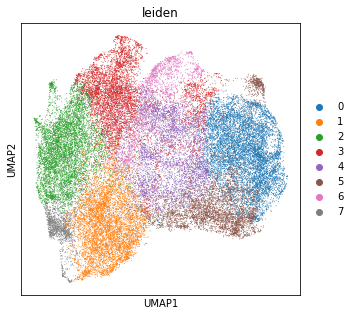

In [47]:
sc.tl.leiden(col, resolution = 0.5, neighbors_key="neighbors_scvi")
sc.pl.umap(col, color=['leiden'])

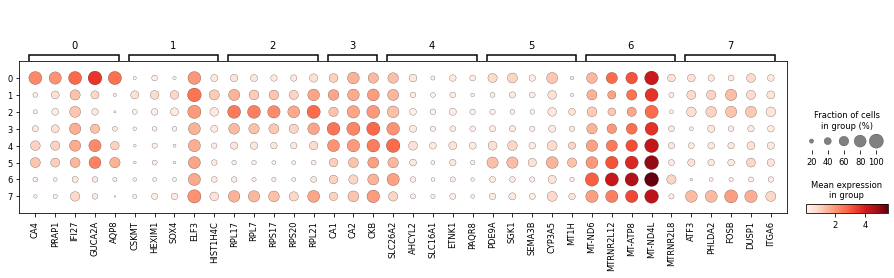

In [48]:
col.raw = col.copy()
mkst = calc_marker_stats(col, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(col, groupby='leiden', mks=mks)

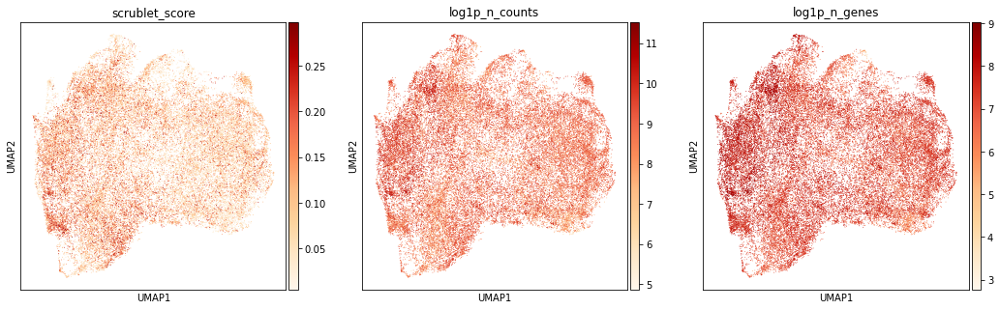

In [49]:
sc.pl.umap(col,color=['scrublet_score','log1p_n_counts','log1p_n_genes'],cmap='OrRd')

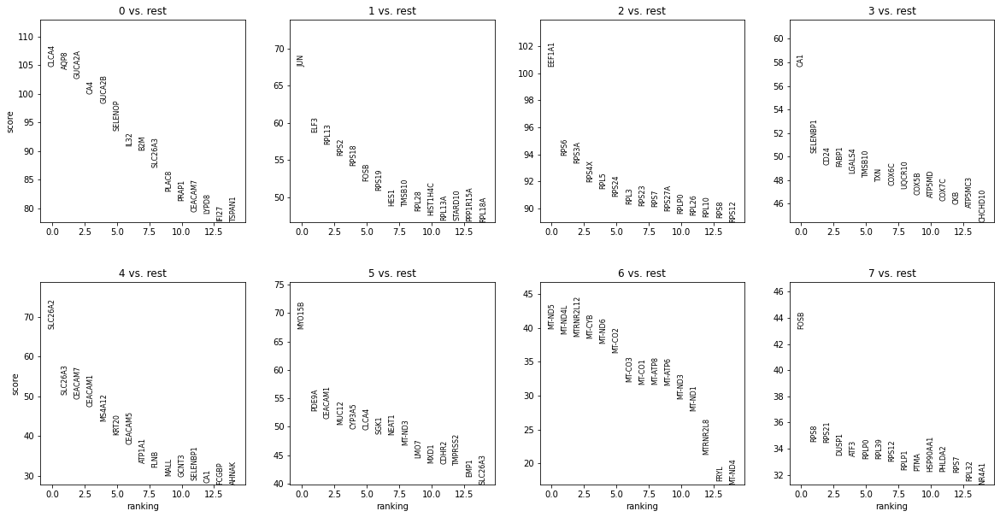

In [50]:
sc.tl.rank_genes_groups(col, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(col, n_genes=15, sharey=False)

In [51]:
gob = adata[adata.obs.annot_v3.isin(['LI_AP_goblet'])].copy()

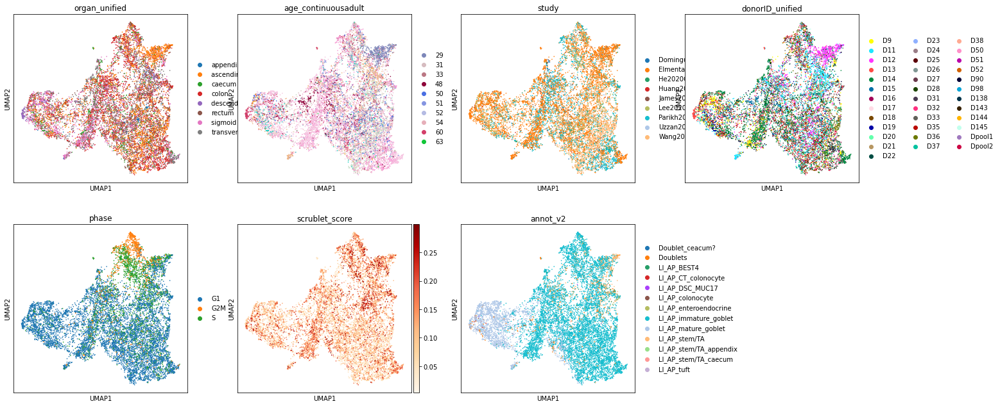

In [55]:
sc.pp.neighbors(
            gob,
            use_rep="X_scvi",
            n_pcs=gob.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(gob, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(gob, color=['organ_unified', 'age_continuousadult','study','donorID_unified','phase','scrublet_score','annot_v2'],cmap='OrRd')

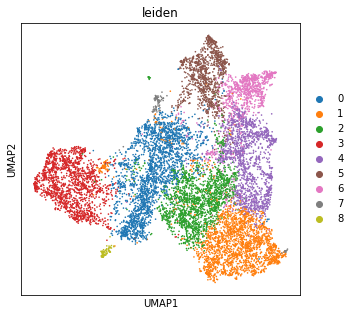

In [53]:
sc.tl.leiden(gob, resolution = 0.5, neighbors_key="neighbors_scvi")
sc.pl.umap(gob, color=['leiden'])

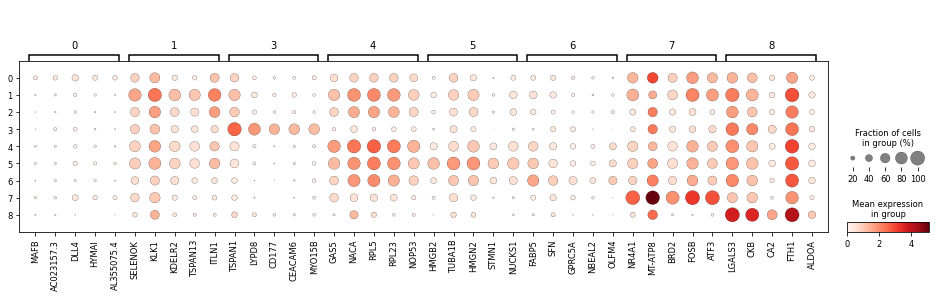

In [54]:
gob.raw = gob.copy()
mkst = calc_marker_stats(gob, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(gob, groupby='leiden', mks=mks)

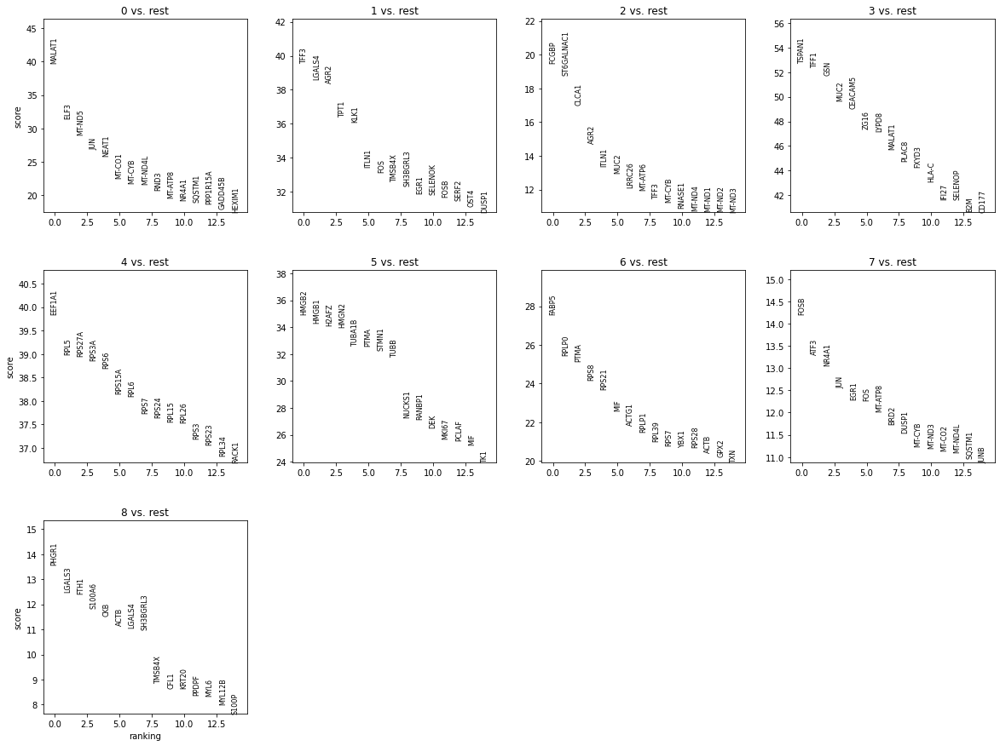

In [56]:
sc.tl.rank_genes_groups(gob, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(gob, n_genes=15, sharey=False)

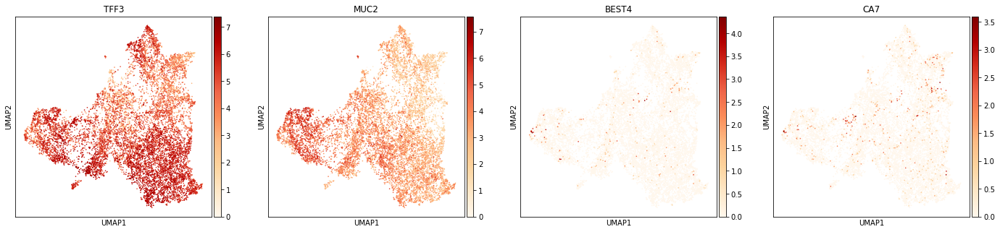

In [58]:
sc.pl.umap(gob,color=['TFF3','MUC2','BEST4','CA7'],cmap='OrRd')

In [59]:
eec = adata[adata.obs.annot_v3.isin(['LI_AP_enteroendocrine'])].copy()

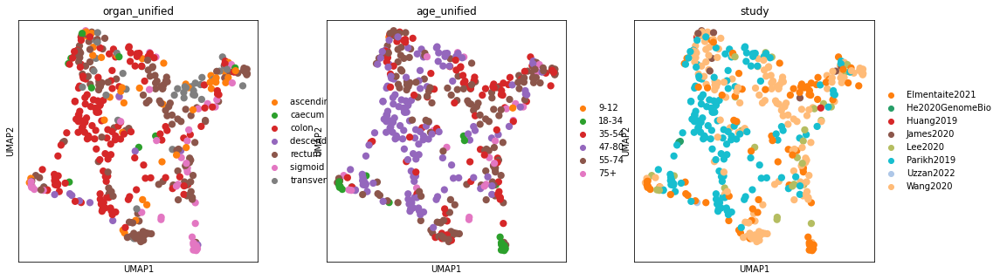

In [60]:
sc.pp.neighbors(
            eec,
            use_rep="X_scvi",
            n_pcs=eec.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(eec, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(eec, color=['organ_unified', 'age_unified','study'])

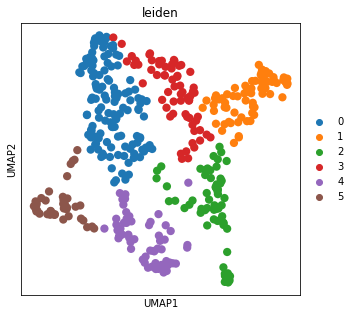

In [61]:
sc.tl.leiden(eec, resolution = 0.5, neighbors_key="neighbors_scvi")
sc.pl.umap(eec, color=['leiden'])

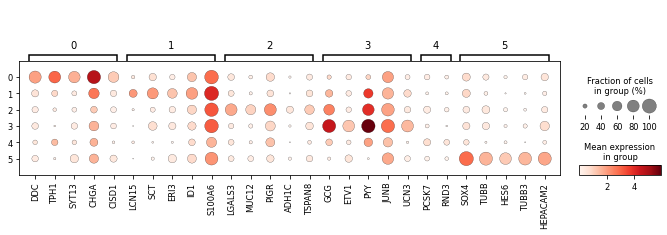

In [62]:
eec.raw = eec.copy()
mkst = calc_marker_stats(eec, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(eec, groupby='leiden', mks=mks)

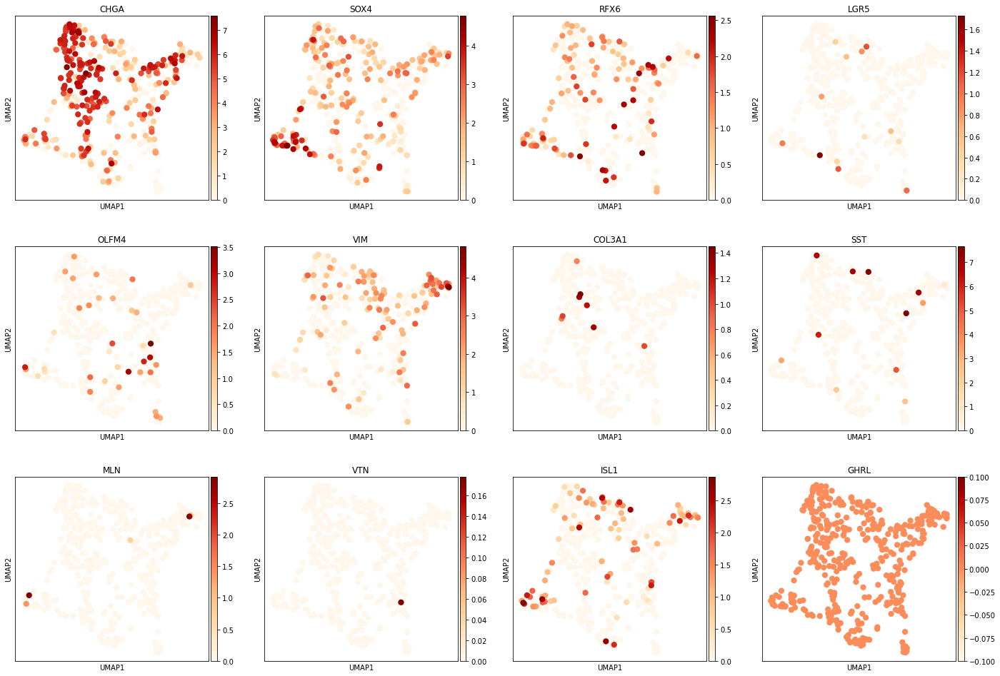

In [63]:
sc.pl.umap(eec,color=['CHGA','SOX4','RFX6','LGR5','OLFM4','VIM','COL3A1','SST','MLN','VTN','ISL1','GHRL'],cmap='OrRd')

In [64]:
new_cluster_names = [
    'LI_AP_enteroendocrine','LI_AP_enteroendocrine', #0,1
    'LI_AP_enteroendocrine','LI_AP_enteroendocrine', #2,3
    'LI_AP_enteroendocrine','LI_AP_enteroendocrine_SOX4',#4,5 

]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

eec.obs['annot_v3'] = [conv[x] for x in eec.obs['leiden']]

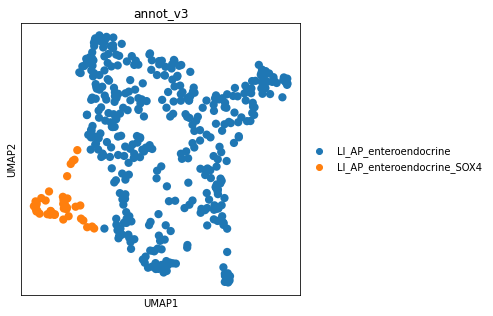

In [65]:
sc.pl.umap(eec,color='annot_v3')

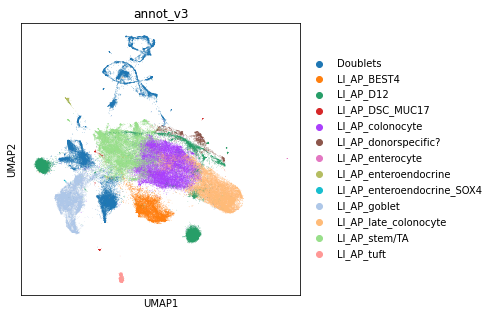

In [66]:
ON = {O:N for O,N in zip(eec.obs_names,eec.obs["annot_v3"])}
adata.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["annot_v3"])]
sc.pl.umap(adata,color='annot_v3')

In [67]:
b4 = adata[adata.obs.annot_v3.isin(['LI_AP_BEST4'])].copy()

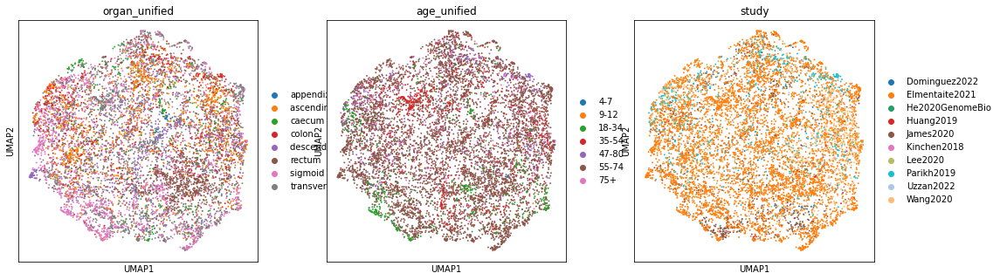

In [68]:
sc.pp.neighbors(
            b4,
            use_rep="X_scvi",
            n_pcs=b4.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(b4, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(b4, color=['organ_unified', 'age_unified','study'])

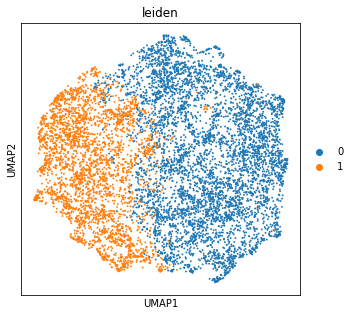

In [69]:
sc.tl.leiden(b4, resolution = 0.2, neighbors_key="neighbors_scvi")
sc.pl.umap(b4, color=['leiden'])

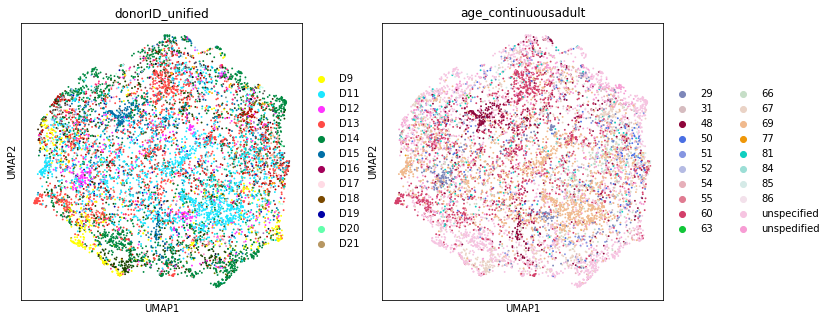

In [70]:
sc.pl.umap(b4,color=['donorID_unified','age_continuousadult'],cmap='OrRd')

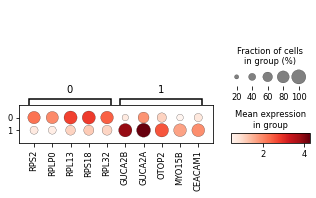

In [71]:
b4.raw = b4.copy()
mkst = calc_marker_stats(b4, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(b4, groupby='leiden', mks=mks)

In [72]:
stem = adata[adata.obs.annot_v3.isin(['LI_AP_stem/TA'])].copy()

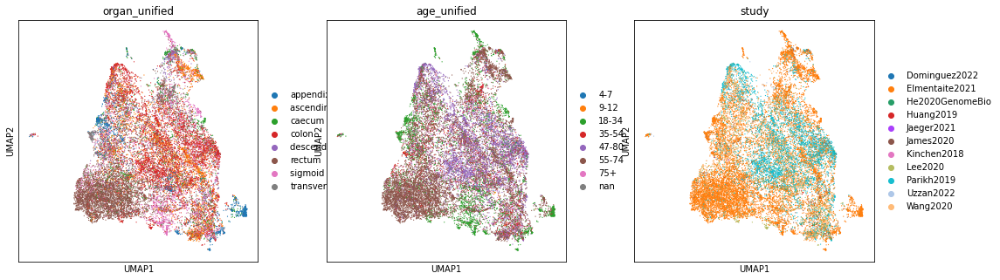

In [73]:
sc.pp.neighbors(
            stem,
            use_rep="X_scvi",
            n_pcs=stem.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(stem, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(stem, color=['organ_unified', 'age_unified','study'])

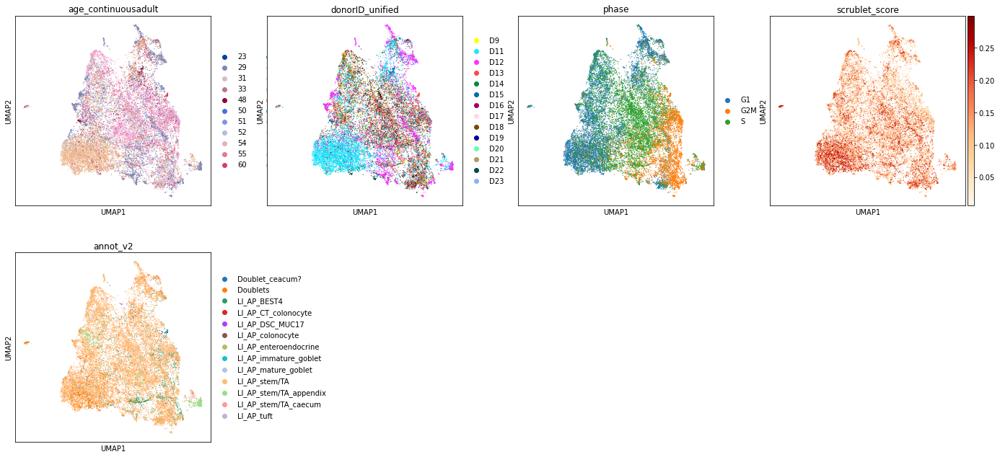

In [81]:
sc.pl.umap(stem,color=['age_continuousadult','donorID_unified','phase','scrublet_score','annot_v2'],cmap='OrRd')

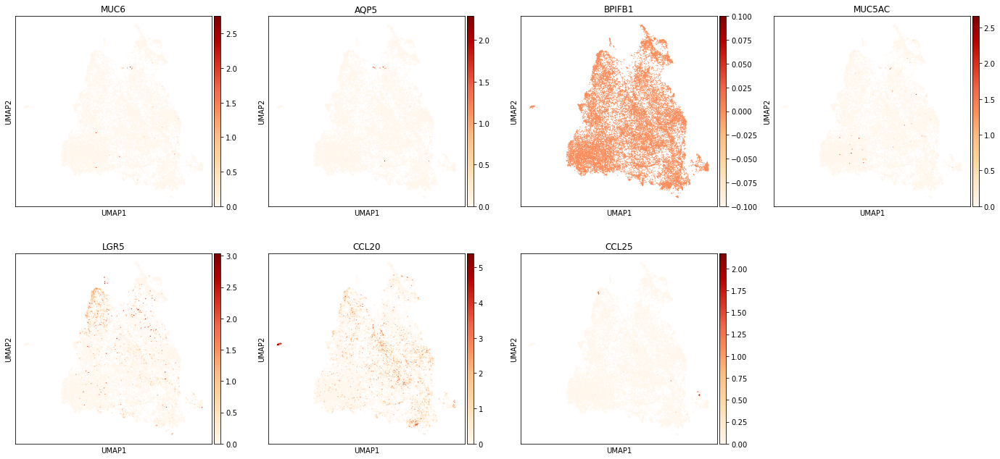

In [97]:
sc.pl.umap(stem,color=['MUC6','AQP5','BPIFB1','MUC5AC','LGR5','CCL20','CCL25'],cmap='OrRd')

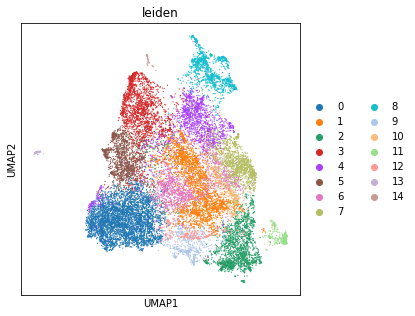

In [114]:
sc.tl.leiden(stem, resolution = 0.7, neighbors_key="neighbors_scvi")
sc.pl.umap(stem, color=['leiden'])

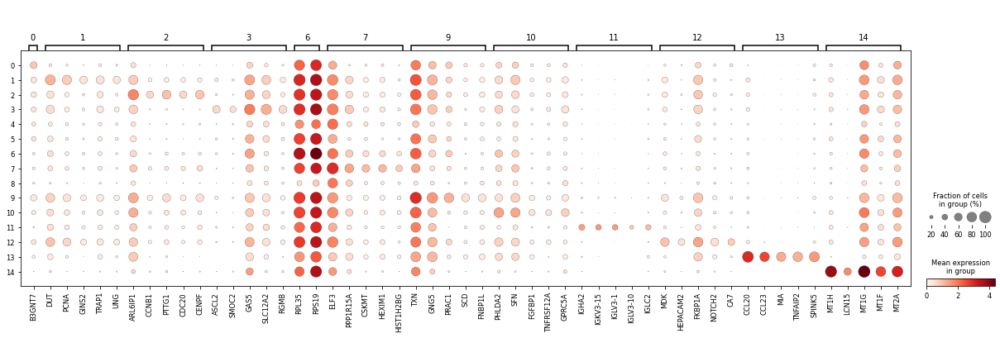

In [91]:
stem.raw = stem.copy()
mkst = calc_marker_stats(stem, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(stem, groupby='leiden', mks=mks)

In [93]:
pd.crosstab(stem.obs.leiden,stem.obs.phase)

phase,G1,G2M,S
leiden,,,
0,2960,179,1320
1,41,380,2311
2,379,1394,225
3,991,15,977
4,715,134,782
5,1000,29,500
6,325,311,815
7,75,842,448
8,997,89,249


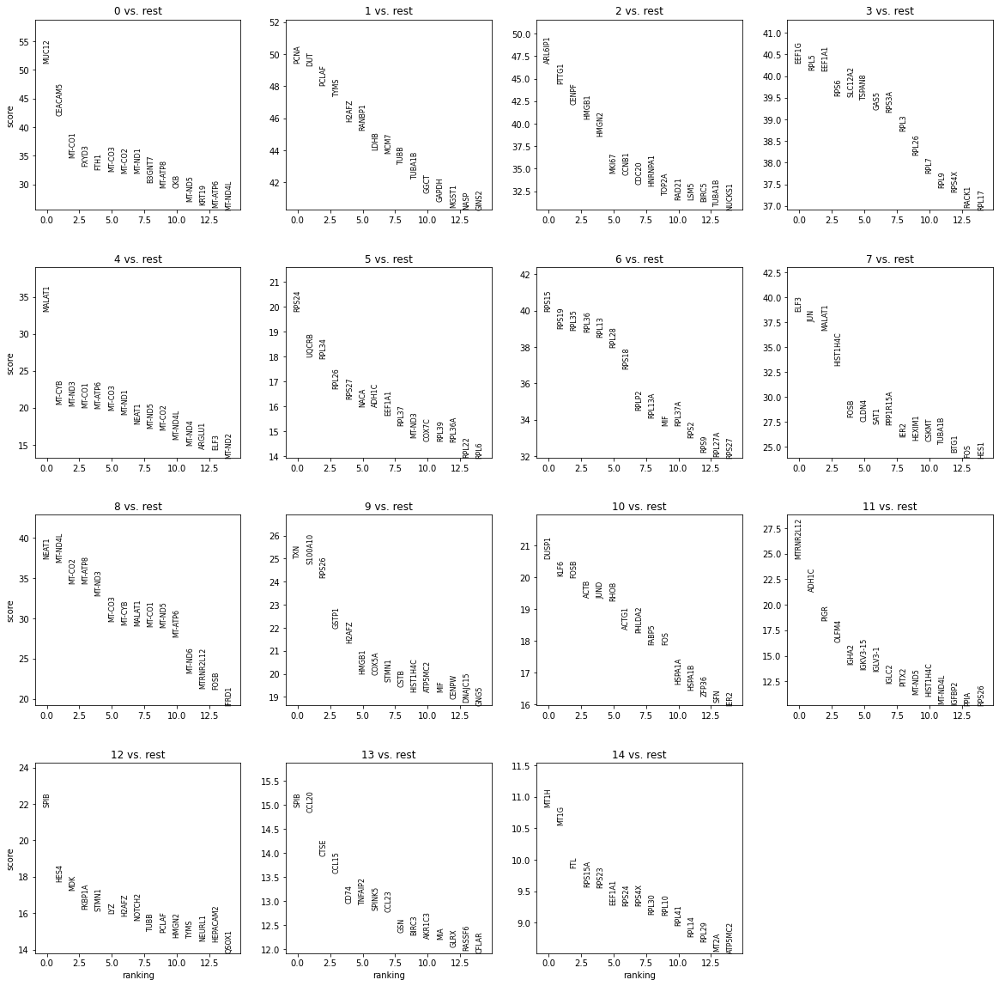

In [92]:
sc.tl.rank_genes_groups(stem, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(stem, n_genes=15, sharey=False)

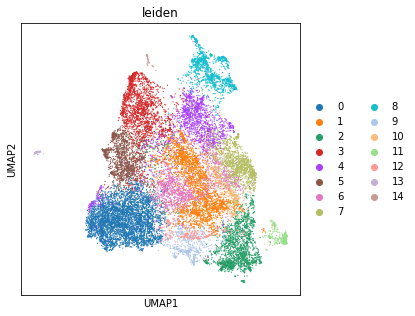

In [96]:
sc.pl.umap(stem,color=['leiden'])

In [115]:
new_cluster_names = [
    'LI_AP_TA','LI_AP_TA_cyclingS', #0,1
    'LI_AP_TA_cyclingG2M','LI_AP_stem',#2,3
    'LI_AP_TA','LI_AP_TA', #4,5
        'LI_AP_TA','LI_AP_TA_cyclingG2M',#6,7
        'LI_AP_TA','LI_AP_TA',#8,9
        'LI_AP_TA','Doublets',#10,11
        'LI_AP_TA_cyclingS','Doublets',#12,13
        'LI_AP_TA'#14
]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

stem.obs['annot_v3'] = [conv[x] for x in stem.obs['leiden']]

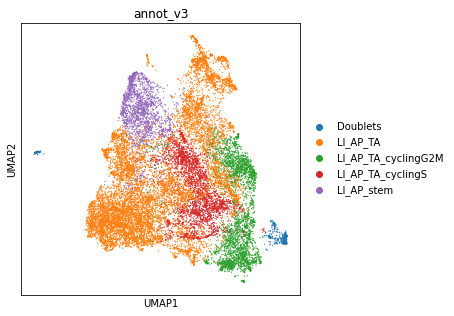

In [116]:
sc.pl.umap(stem,color='annot_v3')

In [117]:
doub = stem[stem.obs.annot_v3.isin(['Doublets'])].copy()

In [118]:
doub.obs.annot_v3.value_counts()

Doublets    542
Name: annot_v3, dtype: int64

match with SI_AP, just label as cycling without distinction of cell cycle phase

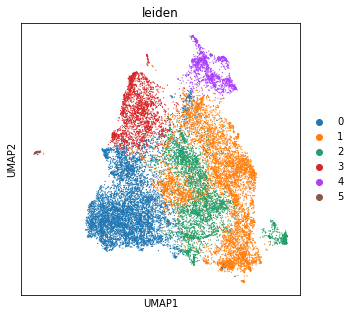

In [119]:
sc.tl.leiden(stem, resolution = 0.2, neighbors_key="neighbors_scvi")
sc.pl.umap(stem, color=['leiden'])

In [120]:
new_cluster_names = [
    'LI_AP_TA','LI_AP_TA_cycling', #0,1
    'LI_AP_TA_cycling','LI_AP_stem',#2,3
    'LI_AP_TA','Doublets' #4,5
]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

stem.obs['annot_v3'] = [conv[x] for x in stem.obs['leiden']]

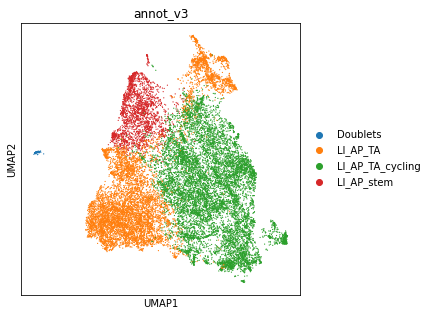

In [121]:
sc.pl.umap(stem,color='annot_v3')

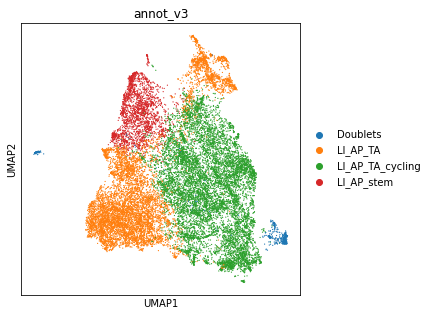

In [122]:
ON = {O:N for O,N in zip(doub.obs_names,doub.obs["annot_v3"])}
stem.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(stem.obs_names, stem.obs["annot_v3"])]
sc.pl.umap(stem,color='annot_v3')

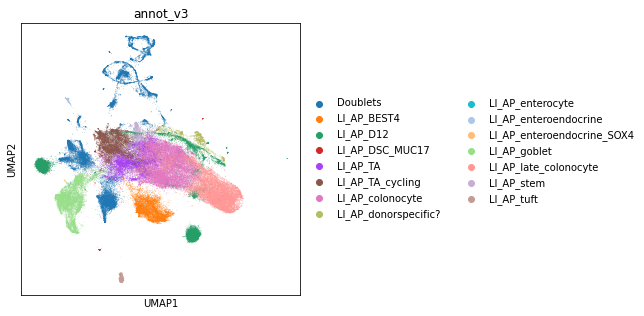

In [124]:
ON = {O:N for O,N in zip(stem.obs_names,stem.obs["annot_v3"])}
adata.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["annot_v3"])]
sc.pl.umap(adata,color='annot_v3')

In [125]:
ta_col = adata[adata.obs.annot_v3.isin(['LI_AP_TA','LI_AP_late_colonocyte','LI_AP_colonocyte'])].copy()

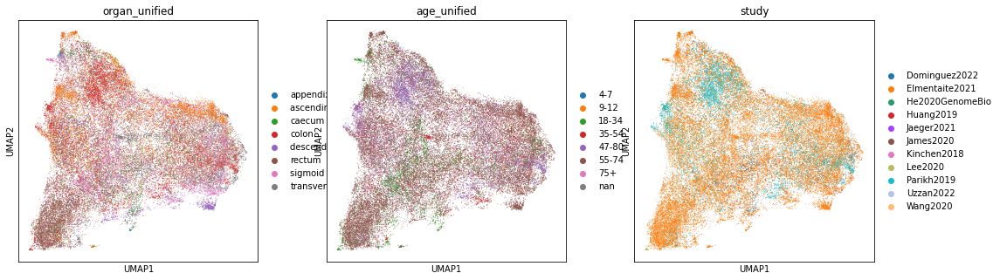

In [126]:
sc.pp.neighbors(
            ta_col,
            use_rep="X_scvi",
            n_pcs=ta_col.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(ta_col, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(ta_col, color=['organ_unified', 'age_unified','study'])

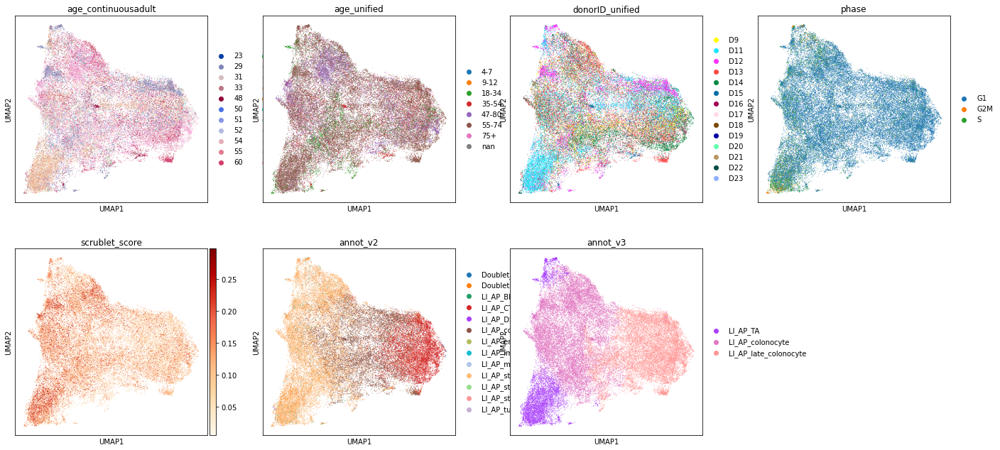

In [134]:
sc.pl.umap(ta_col,color=['age_continuousadult','age_unified','donorID_unified','phase','scrublet_score','annot_v2','annot_v3'],cmap='OrRd')

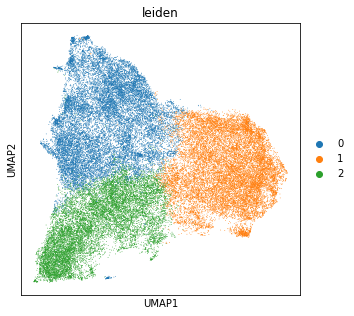

In [133]:
sc.tl.leiden(ta_col, resolution = 0.2, neighbors_key="neighbors_scvi")
sc.pl.umap(ta_col, color=['leiden'])

In [137]:
new_cluster_names = [
    'LI_AP_colonocyte','LI_AP_late_colonocyte', #0,1
    'LI_AP_colonocyte'#2
]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

ta_col.obs['annot_v3'] = [conv[x] for x in ta_col.obs['leiden']]

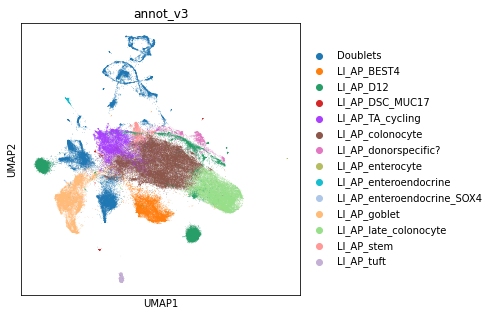

In [138]:
ON = {O:N for O,N in zip(ta_col.obs_names,ta_col.obs["annot_v3"])}
adata.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["annot_v3"])]
sc.pl.umap(adata,color='annot_v3')

In [139]:
m17 = adata[adata.obs.annot_v3.isin(['LI_AP_DSC_MUC17'])].copy()

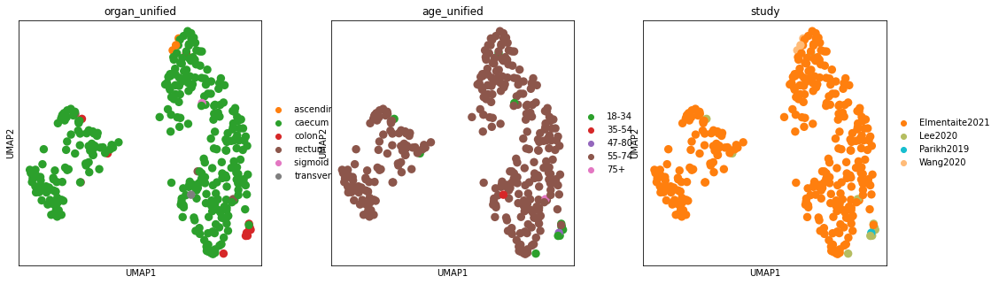

In [140]:
sc.pp.neighbors(
            m17,
            use_rep="X_scvi",
            n_pcs=m17.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(m17, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(m17, color=['organ_unified', 'age_unified','study'])

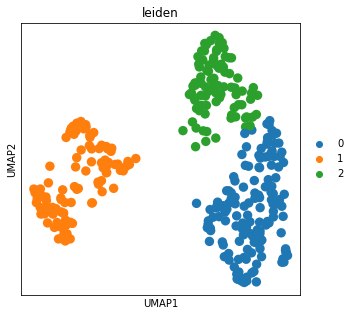

In [141]:
sc.tl.leiden(m17, resolution = 0.2, neighbors_key="neighbors_scvi")
sc.pl.umap(m17, color=['leiden'])

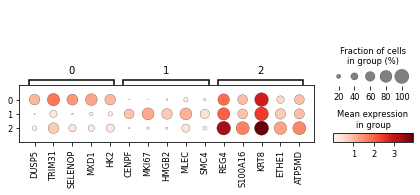

In [142]:
m17.raw = m17.copy()
mkst = calc_marker_stats(m17, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(m17, groupby='leiden', mks=mks)

         Falling back to preprocessing with `sc.pp.pca` and default params.


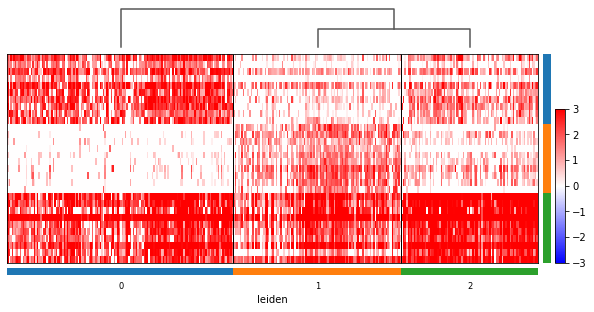

In [143]:
sc.tl.rank_genes_groups(m17,groupby='leiden',method='wilcoxon')
sc.tl.dendrogram(m17, groupby='leiden')
sc.pl.rank_genes_groups_heatmap(m17,groupby='leiden', n_genes=10, use_raw=False, swap_axes=True, show_gene_labels=False,
                                vmin=-3, vmax=3, cmap='bwr')

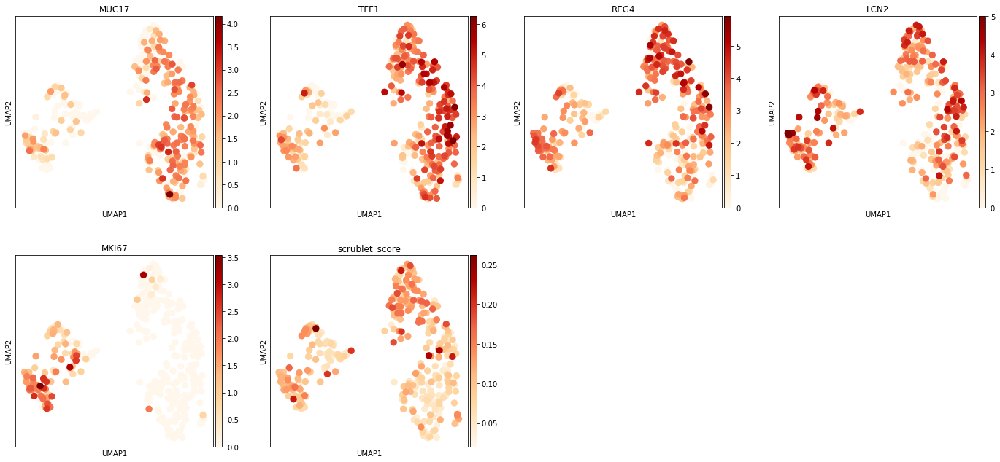

In [148]:
sc.pl.umap(m17,color=['MUC17','TFF1','REG4','LCN2','MKI67','scrublet_score'],cmap='OrRd')

In [149]:
new_cluster_names = [
    'LI_AP_DSC_MUC17','LI_AP_DSC_MUC17_cycling', #0,1
    'LI_AP_DSC_MUC17'#2
]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

m17.obs['annot_v3'] = [conv[x] for x in m17.obs['leiden']]

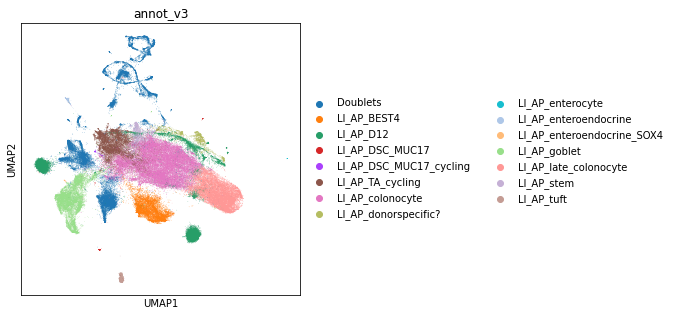

In [150]:
ON = {O:N for O,N in zip(m17.obs_names,m17.obs["annot_v3"])}
adata.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["annot_v3"])]
sc.pl.umap(adata,color='annot_v3')

Exclude donor specific clusters by annotating as doublets

In [151]:
adata.obs['annot_v3'] = (
    adata.obs["annot_v3"]
    .map(lambda x: {'LI_AP_D12':'Doublets','LI_AP_donorspecific?':'Doublets'}.get(x, x))
    .astype("category")
)

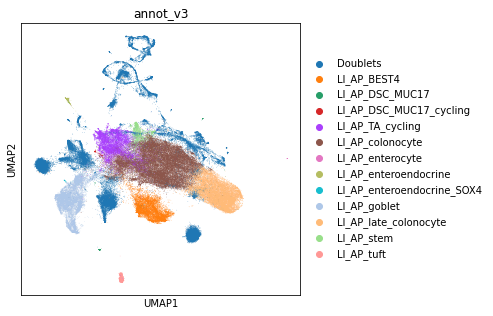

In [152]:
sc.pl.umap(adata,color='annot_v3')

In [153]:
adata.write_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/LI_AP_epi.hvg5000_noRPL.scvi_output.annotv3.20221201.h5ad')

In [154]:
annot = adata.obs.loc[:,['annot_v2','annot_v3']]

In [155]:
annot.to_csv('/nfs/team205/ao15/Megagut/Annotations_v3/compartment_annotations/csv/LI_AP_epi_annot_v3_draft.csv')

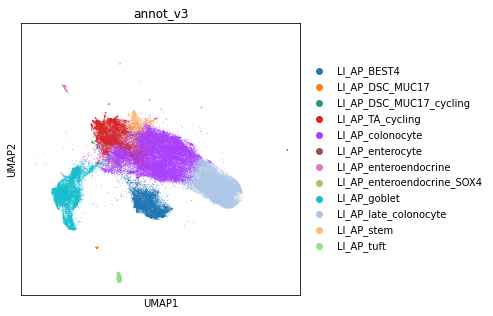

In [156]:
adata_nodoublets = adata[~adata.obs.annot_v3.isin(['Doublets'])].copy()
sc.pl.umap(adata_nodoublets,color='annot_v3')

In [157]:
adata_nodoublets.X.max()

8.88183

In [158]:
#recover raw
adata_nodoublets.X = adata_nodoublets.layers['counts']

In [159]:
adata_nodoublets.X.max()

8650.0

In [160]:
adata_nodoublets.write_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/pre_scvi20221124/no_doublets/LI_AP_epi.raw.annotv3.nodoublets.20221201.h5ad')

In [2]:
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/LI_AP_epi.hvg5000_noRPL.scvi_output.annotv3.20221201.h5ad')

In [3]:
adata.obs['annot_v3'] = (
    adata.obs["annot_v3"]
    .map(lambda x: {'LI_AP_enteroendocrine_SOX4':'LI_AP_enteroendocrine_progenitor'}.get(x, x))
    .astype("category")
)

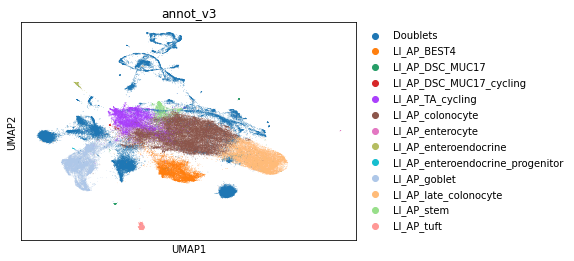

In [4]:
sc.pl.umap(adata,color='annot_v3')

In [5]:
adata.write_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/LI_AP_epi.hvg5000_noRPL.scvi_output.annotv3.20221206.h5ad')

In [6]:
annot = adata.obs.loc[:,['annot_v2','annot_v3']]

In [7]:
annot.to_csv('/nfs/team205/ao15/Megagut/Annotations_v3/compartment_annotations/csv/LI_AP_epi_annot_v3_draft.csv')

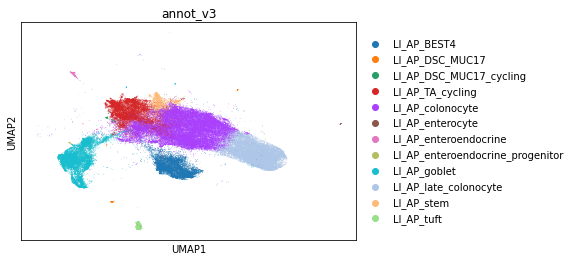

In [8]:
adata_nodoublets = adata[~adata.obs.annot_v3.isin(['Doublets'])].copy()
sc.pl.umap(adata_nodoublets,color='annot_v3')

In [9]:
#recover raw
adata_nodoublets.X = adata_nodoublets.layers['counts']

In [10]:
adata_nodoublets.X.max()

8650.0

In [11]:
adata_nodoublets.write_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/pre_scvi20221124/no_doublets/LI_AP_epi.raw.annotv3.nodoublets.20221206.h5ad')

### Marker genes and UMAP plots

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sc.logging.print_header()

scanpy==1.8.0 anndata==0.8.0 umap==0.4.6 numpy==1.20.1 scipy==1.6.1 pandas==1.3.5 scikit-learn==0.24.1 statsmodels==0.13.5 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3 pynndescent==0.5.2


In [2]:
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/no_doublets/LI_AP_epi.hvg5000_noRPL.scvi_output.annotv3.nodoublets.22021208.h5ad')

In [3]:
adata.obs['fine_annot'] = adata.obs["annot_v3"].str.replace("LI_AP_","")
adata.obs['fine_annot'] = (
    adata.obs["fine_annot"]
    .map(lambda x: {'colonocyte':'Colonocyte',
 'enteroendocrine':'Enteroendocrine',
 'goblet':'Goblet',
 'late_colonocyte':'Mature_colonocyte',
 'tuft':'Tuft',
 'enterocyte':'Enterocyte',
 'stem':'Stem',
 'enteroendocrine_progenitor':'Enteroendocrine_progenitor',
                    'DSC_MUC17':'DCS_MUC17',
                    'DSC_MUC17_cycling':'DCS_MUC17_cycling'
        
         }.get(x, x))
    .astype("category")
)

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


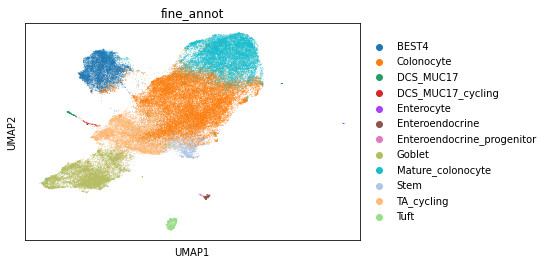

In [4]:
sc.pl.umap(adata,color='fine_annot')

In [5]:
marker_genes_dict = { 'BEST4':['BEST4','CA7','OTOP2','CFTR'],
                     
                     'Colonocyte':['CA1','GPT'],
                     'DCS_MUC17':['MUC17','TFF1','CD55','TM4SF1','DUOX2','DUOXA2'],
                     'Enterocyte':['FABP2','ALDOB','APOA1'],
                     'Enteroendocrine':['CHGA','PCSK1N','SCT','SCGN','NEUROD1'],
                     'Enteroendocrine_progenitor':['SOX4'],
                     'Goblet':['TFF3','FCGBP','ZG16','MUC2'],
                     'Mature_colonocyte':['SLC26A3','AQP8','CEACAM7'],
                     'Stem':['LGR5','RGMB','ASCL2','OLFM4'],
                     'Cycling markers':['MKI67','PCLAF','PCNA','TOP2A'],
                     'Tuft':['SH2D6','LRMP','MATK','FYB1','HPGDS']
                     }

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


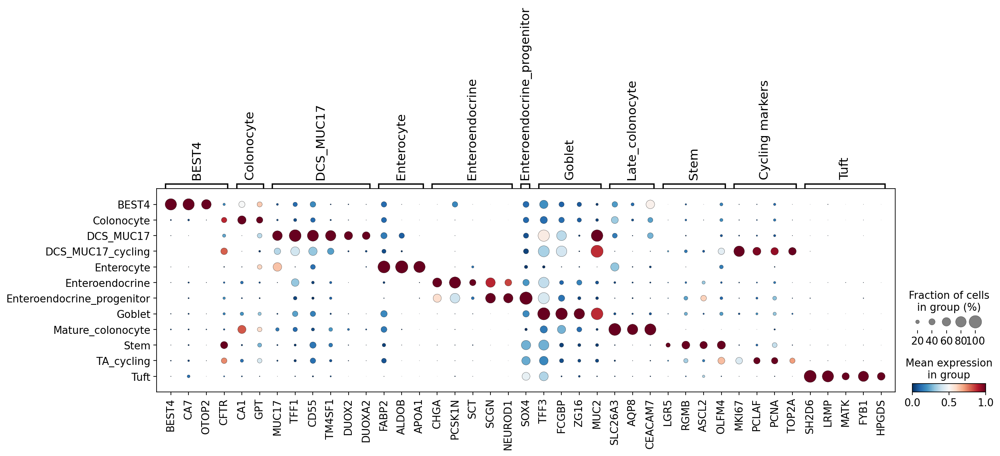

In [6]:
sc.set_figure_params(dpi_save = 300)
sc.pl.dotplot(adata,var_names=marker_genes_dict,groupby='fine_annot',save='Epi_LI_markers.png',color_map='RdBu_r', standard_scale='var')

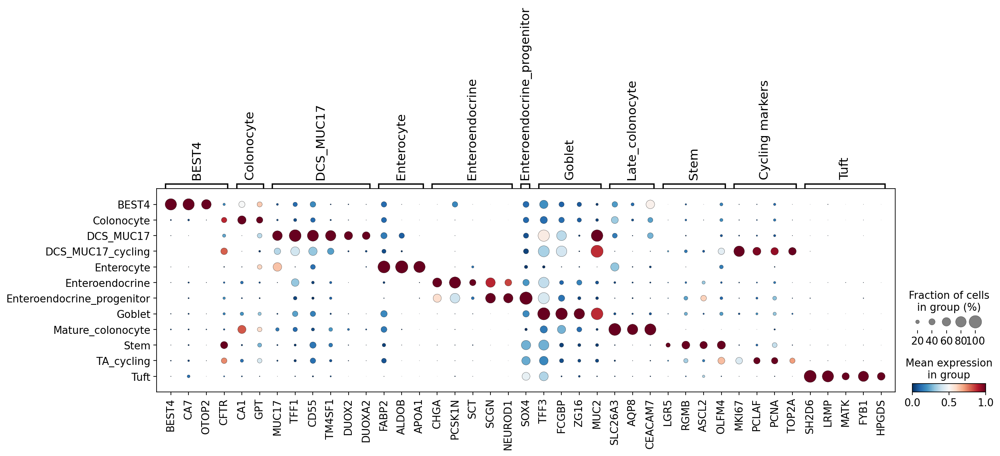

In [7]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
sc.pl.dotplot(adata,var_names=marker_genes_dict,groupby='fine_annot',save='Epi_LI_markers.pdf',color_map='RdBu_r', standard_scale='var')

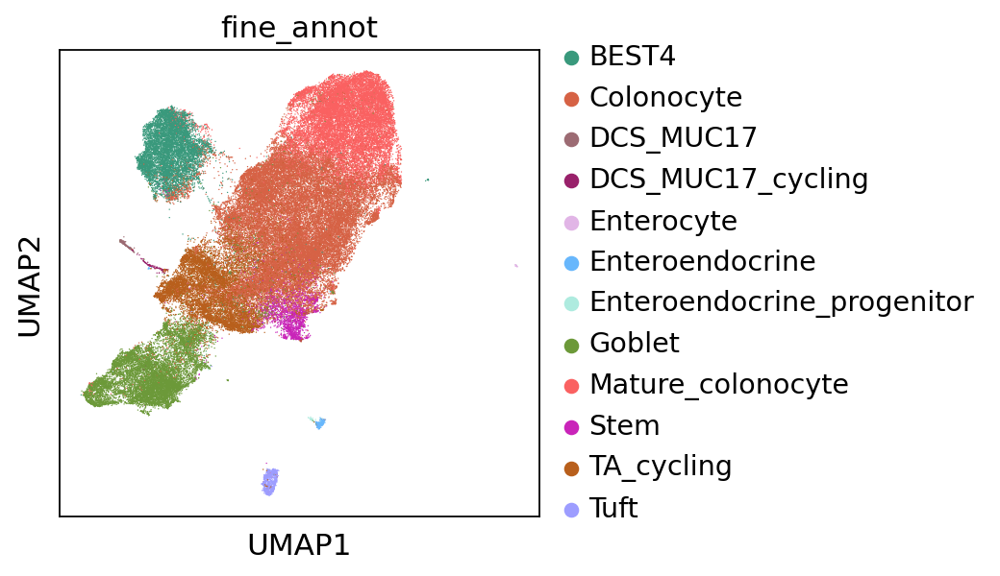

In [8]:
sc.pl.umap(adata,color='fine_annot',palette = ['#39997c',#BEST4
                                               '#d66245',#Colonocyte
                                               '#9c6b73',#DSC_MUC17
                                               '#99216b',#DSC_MUC17 cycling
                                               '#e1b5e6',#enterocyte
                                                '#68b7fc',#enteroendocrine
                                               '#aeebdf',#enteroendocrine progenitor
                                               
                                               '#6c9939',#goblet
                                               '#fa6161',#late colonocyte
                                               '#c924b9',#stem
                                               '#b85f1c',#TA cycling
                                               '#9d9dff',#tuft
                                               
                                               
    
    
                                              ])

In [9]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
plt.rcParams['figure.figsize'] = [5,5]
sc.set_figure_params(dpi=300,dpi_save=600)

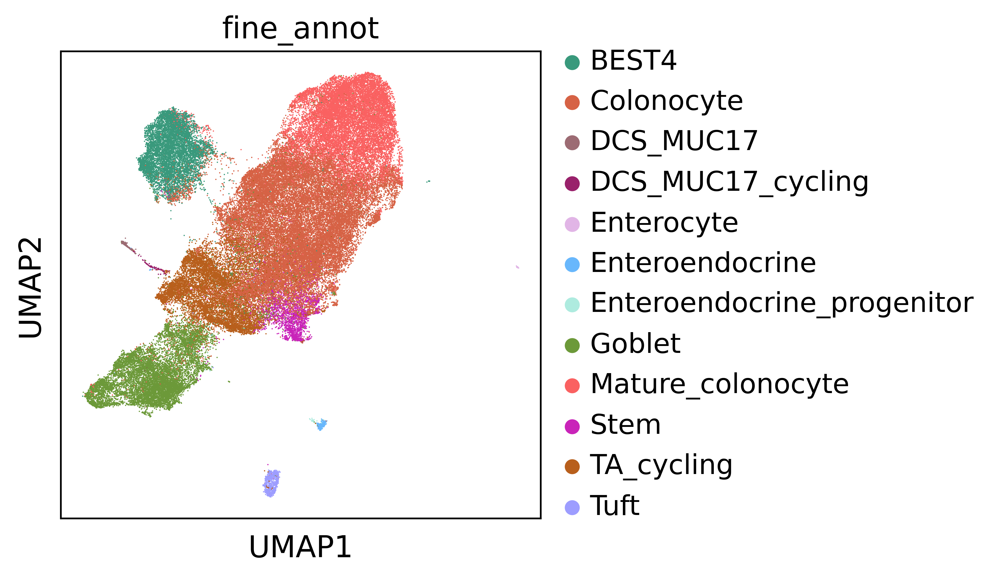

In [10]:
sc.pl.umap(adata,color='fine_annot',save='LI_AP_epi_annot.png')

<AxesSubplot: title={'center': 'fine_annot'}, xlabel='UMAP1', ylabel='UMAP2'>

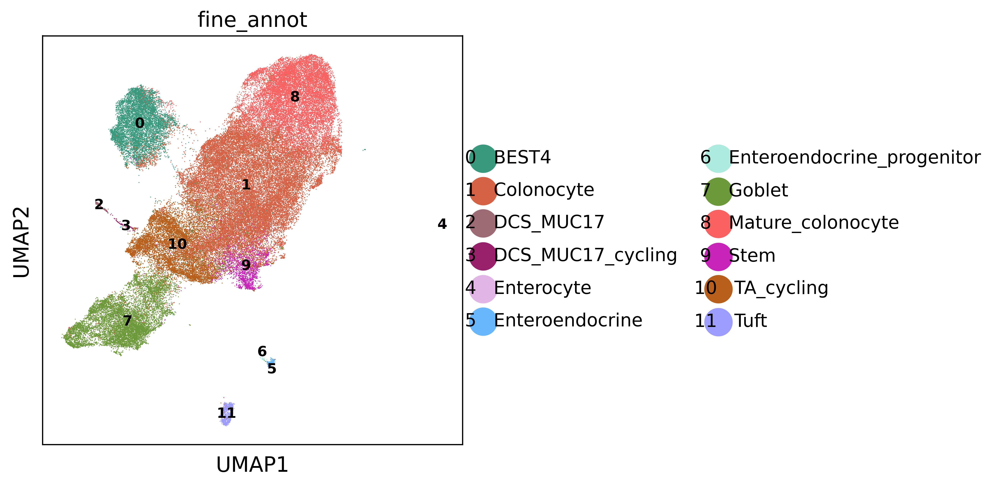

In [11]:
import sctk as sk
sk.plot_embedding(
    adata,
    basis="umap",
    groupby="fine_annot",
    figsize=(5, 5),
    save='figures/LI_AP_epi_annot.png')

### Refine annotations and remove donor specific clusters for scANVI model

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sc.logging.print_header()

scanpy==1.8.0 anndata==0.8.0 umap==0.4.6 numpy==1.20.1 scipy==1.6.1 pandas==1.3.5 scikit-learn==0.24.1 statsmodels==0.13.5 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3 pynndescent==0.5.2


In [2]:
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/LI_AP_epi.hvg5000_noRPL.scvi_output.annotv3.20221206.h5ad')

In [3]:
adata

AnnData object with n_obs × n_vars = 120417 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_sp

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


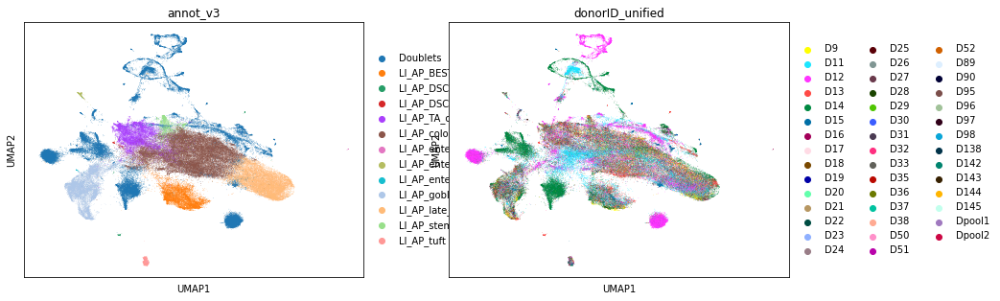

In [4]:
sc.pl.umap(adata,color=['annot_v3','donorID_unified'])

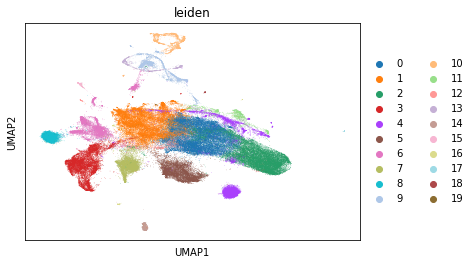

In [5]:
sc.tl.leiden(adata, resolution = 0.5, neighbors_key="neighbors_scvi")
sc.pl.umap(adata,color=['leiden'])

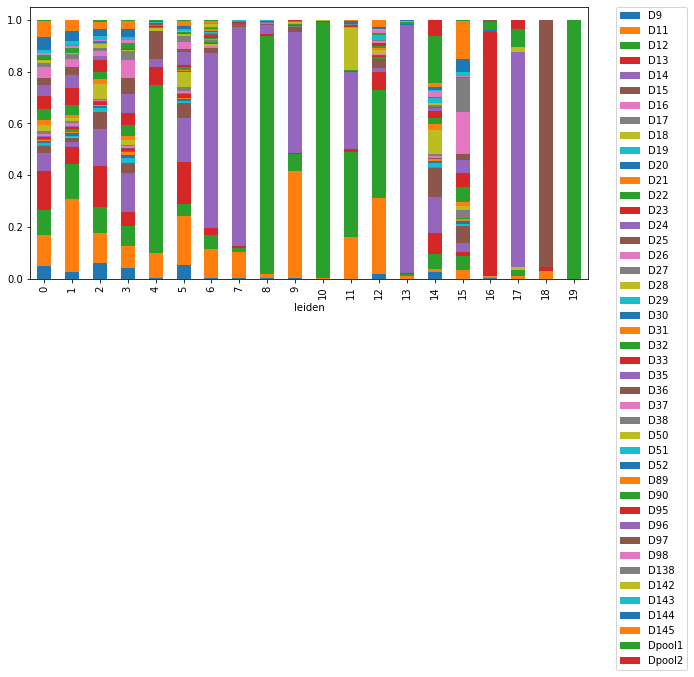

In [6]:
plt.rcParams['figure.figsize'] = [10,5]
tmp = pd.crosstab(adata.obs['leiden'], adata.obs['donorID_unified'],normalize='index')
tmp.plot.bar(stacked=True).legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


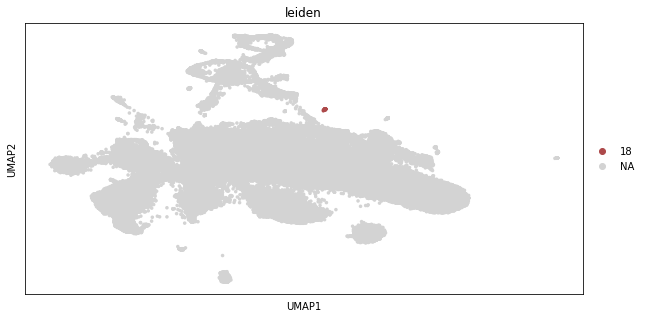

In [7]:
sc.pl.umap(adata,color=['leiden'],groups='18',size=50)

In [8]:
donor = adata[adata.obs.leiden.isin(['7','8','9','10','13','17','18','19'])]

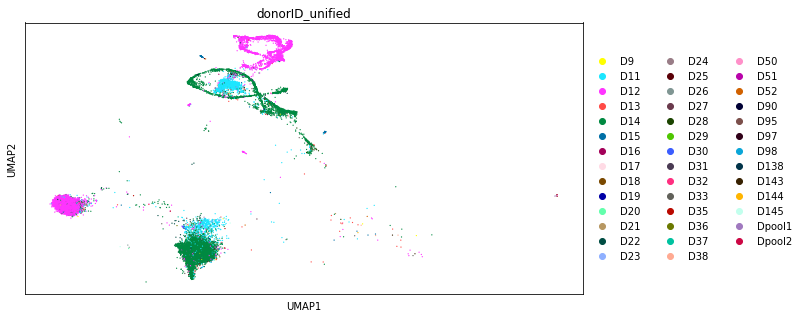

In [9]:
sc.pl.umap(donor,color='donorID_unified')

In [10]:
donor = donor[donor.obs.donorID_unified.isin(['D11','D12','D14'])]

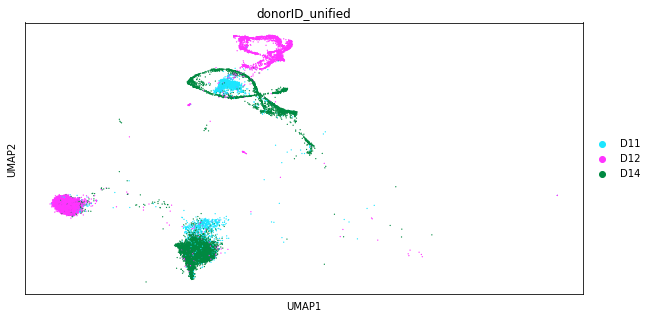

In [11]:
sc.pl.umap(donor,color='donorID_unified')

In [12]:
#define donor specific clusters
donor.obs['annot_v3'] = (
   donor.obs["donorID_unified"]
    .map(lambda x: {'D11':'Donor_specific',
                    'D12':'Donor_specific',
                    'D14':'Donor_specific'
    }.get(x, x))
    .astype("category")
)

<ipython-input-12-f5f1ba0f170b>:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  donor.obs['annot_v3'] = (


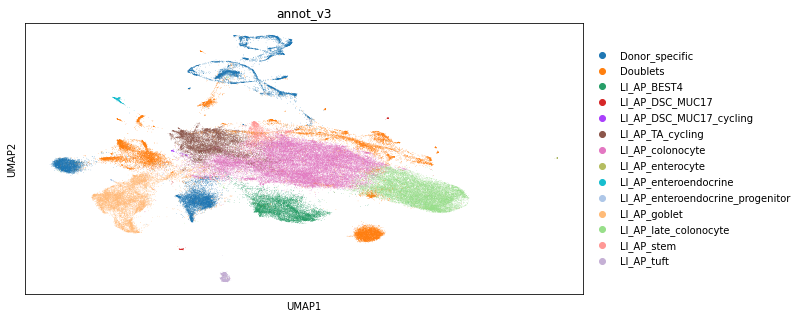

In [13]:
ON = {O:N for O,N in zip(donor.obs_names,donor.obs["annot_v3"])}
adata.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["annot_v3"])]
sc.pl.umap(adata,color='annot_v3')

In [14]:
#remove donor specific clusters
adata = adata[~adata.obs.annot_v3.isin(['Donor_specific'])].copy()

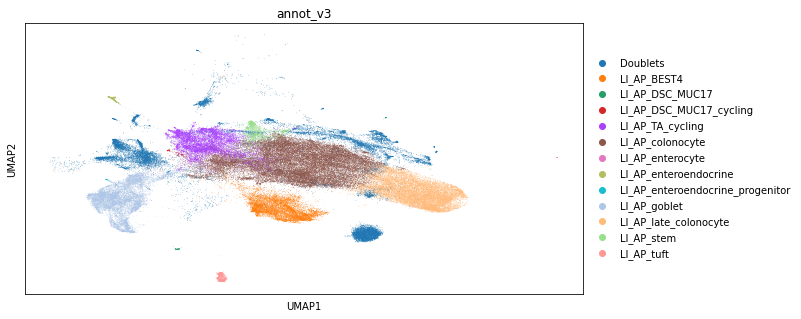

In [15]:
sc.pl.umap(adata,color='annot_v3')

In [16]:
list(adata.obs.annot_v3.unique())

['LI_AP_colonocyte',
 'LI_AP_BEST4',
 'LI_AP_enteroendocrine',
 'Doublets',
 'LI_AP_goblet',
 'LI_AP_late_colonocyte',
 'LI_AP_DSC_MUC17',
 'LI_AP_tuft',
 'LI_AP_enterocyte',
 'LI_AP_TA_cycling',
 'LI_AP_stem',
 'LI_AP_enteroendocrine_progenitor',
 'LI_AP_DSC_MUC17_cycling']

In [17]:
#rename annotations for new scvi/scANVI model
adata.obs['fine_annot'] = (
   adata.obs["annot_v3"]
    .map(lambda x: {'LI_AP_colonocyte':'Colonocyte',
 'LI_AP_BEST4':'BEST4_enterocyte_colonocyte',
 'LI_AP_enteroendocrine':'Enteroendocrine',
 'Doublets':'Doublets',
 'LI_AP_goblet':'Goblet',
 'LI_AP_late_colonocyte':'Mature_colonocyte',
 'LI_AP_DSC_MUC17':'DCS_MUC17',
 'LI_AP_tuft':'Tuft',
 'LI_AP_enterocyte':'Enterocyte',
 'LI_AP_TA_cycling':'TA',
 'LI_AP_stem':'Epithelial_stem',
 'LI_AP_enteroendocrine_progenitor':'Enteroendocrine_progenitor',
 'LI_AP_DSC_MUC17_cycling':'DCS_MUC17_cycling'
        
    }.get(x, x))
    .astype("category")
)

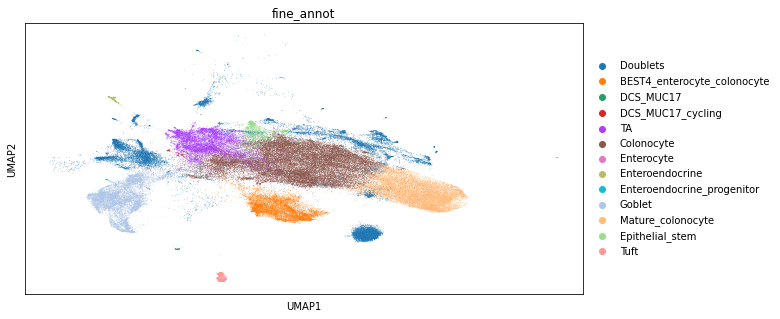

In [18]:
sc.pl.umap(adata,color='fine_annot')

In [19]:
adata.X.max()

8.88183

In [20]:
adata.X = adata.layers['counts']

In [21]:
adata.X.max()

9117.0

In [22]:
adata.write_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/pre_scvi20221124_updated_donorID_20230126/with_doublets/pooled_healthy.lv20_batch256.with_broad_annotation.20220917.with_countlayers.20221124.LI_AP_epi.donor_specific_cluster_removed.20240131.h5ad')